# Etude de la répartition public/privé des établissements scolaires français

## 1. Setting-Up

#### 1.1 Importing librairies & modules

In [291]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
import plotly
import plotly.graph_objects as go
import plotly.io as pio
from tabulate import tabulate
import os
import time
import requests

#### 1.2 Creating the relevant folders and paths

In [292]:
# Defining current folder as our main directory
dirname = os.getcwd()

# Getting current date
datestr = time.strftime("%Y-%m-%d")

# location folders variables
data_in = dirname + "\\da_data_raw\\" + datestr + "\\"
data_out = dirname + "\\da_data_workfiles\\" + datestr + "\\"
graph_out = dirname + "\\graphs\\" 

# Checking if data_in path is not present, then create it
if not os.path.exists(data_in):
    os.makedirs(data_in)
    print(f"Directory Created: {data_in}")
else: 
    print(f"Already existing directory: {data_in}")
    
# Checking if data_out path is not present then create it
if not os.path.exists(data_out):
    os.makedirs(data_out)
    print(f"Directory Created: {data_out}")
else:
    print(f"Already existing directory: {data_out}")
    
# Checking if data_out path is not present then create it
if not os.path.exists(graph_out):
    os.makedirs(graph_out)
    print(f"Directory Created: {graph_out}")
else:
    print(f"Already existing directory: {graph_out}")    

# Printing main directories we will work with
print(f"\nMain directory: {dirname}")
print(f"Raw data folder: {data_in}")
print(f"Workfile folder: {data_out}")

Already existing directory: c:\Users\33671\Documents\Python\IPS\da_data_raw\2022-11-08\
Already existing directory: c:\Users\33671\Documents\Python\IPS\da_data_workfiles\2022-11-08\
Already existing directory: c:\Users\33671\Documents\Python\IPS\graphs\

Main directory: c:\Users\33671\Documents\Python\IPS
Raw data folder: c:\Users\33671\Documents\Python\IPS\da_data_raw\2022-11-08\
Workfile folder: c:\Users\33671\Documents\Python\IPS\da_data_workfiles\2022-11-08\


#### 1.3 Verifying the api response

In [293]:
#fr-en-ips_colleges
dataset_id = "fr-en-ips_colleges"
format = "json"
limit = "10"
r = requests.get(f"https://data.education.gouv.fr/api/v2/catalog/datasets/{dataset_id}/exports/{format}?limit={limit}", 
                 timeout=2)
print(f"{dataset_id}")
print(f"URL: {r.url}")
print(f"HTTP Response Status Code: {r.status_code}") 
print(f"HTTP Error: {r.raise_for_status()}")
print(f"Encoding: {r.encoding}\n")
r.close()

#fr-en-ips_ecoles
dataset_id = "fr-en-ips_ecoles"
format = "json"
limit = "10"
r = requests.get(f"https://data.education.gouv.fr/api/v2/catalog/datasets/{dataset_id}/exports/{format}?limit={limit}", 
                 timeout=2)
print(f"{dataset_id}")
print(f"URL: {r.url}")
print(f"HTTP Response Status Code: {r.status_code}") 
print(f"HTTP Error: {r.raise_for_status()}")
print(f"Encoding: {r.encoding}\n")
r.close()

#fr-en-dnb-par-etablissement
dataset_id = "fr-en-dnb-par-etablissement"
format = "json"
limit = "10"
r = requests.get(f"https://data.education.gouv.fr/api/v2/catalog/datasets/{dataset_id}/exports/{format}?limit={limit}", 
                 timeout=2)
print(f"{dataset_id}")
print(f"URL: {r.url}")
print(f"HTTP Response Status Code: {r.status_code}") 
print(f"HTTP Error: {r.raise_for_status()}")
print(f"Encoding: {r.encoding}\n")
r.close()

#fr-en-adresse-et-geolocalisation-etablissements-premier-et-second-degre
dataset_id = "fr-en-adresse-et-geolocalisation-etablissements-premier-et-second-degre"
format = "json"
limit = "10"
r = requests.get(f"https://data.education.gouv.fr/api/v2/catalog/datasets/{dataset_id}/exports/{format}?limit={limit}", 
                 timeout=2)
print(f"{dataset_id}")
print(f"URL: {r.url}")
print(f"HTTP Response Status Code: {r.status_code}") 
print(f"HTTP Error: {r.raise_for_status()}")
print(f"Encoding: {r.encoding}\n")
r.close()

fr-en-ips_colleges
URL: https://data.education.gouv.fr/api/v2/catalog/datasets/fr-en-ips_colleges/exports/json?limit=10
HTTP Response Status Code: 200
HTTP Error: None
Encoding: utf-8

fr-en-ips_ecoles
URL: https://data.education.gouv.fr/api/v2/catalog/datasets/fr-en-ips_ecoles/exports/json?limit=10
HTTP Response Status Code: 200
HTTP Error: None
Encoding: utf-8

fr-en-dnb-par-etablissement
URL: https://data.education.gouv.fr/api/v2/catalog/datasets/fr-en-dnb-par-etablissement/exports/json?limit=10
HTTP Response Status Code: 200
HTTP Error: None
Encoding: utf-8

fr-en-adresse-et-geolocalisation-etablissements-premier-et-second-degre
URL: https://data.education.gouv.fr/api/v2/catalog/datasets/fr-en-adresse-et-geolocalisation-etablissements-premier-et-second-degre/exports/json?limit=10
HTTP Response Status Code: 200
HTTP Error: None
Encoding: utf-8



## 2. Data Collection & Data Structuration

#### 2.1 Data Collection

##### ips_colleges dataframe

In [294]:
# Loading data
dataset_id = "fr-en-ips_colleges"
format = "json"
limit = "-1" # argument to pass to get the full dataset 
df_raw_ips_colleges = pd.read_json(f"https://data.education.gouv.fr/api/v2/catalog/datasets/{dataset_id}/exports/{format}?limit={limit}")

# Adding column about the type of school
df_raw_ips_colleges['type_etablissement']="COLLEGE"

In [295]:
df_raw_ips_colleges.sample(5)

,rentree_scolaire,academie,code_du_departement,departement,uai,nom_de_l_etablissment,code_insee_de_la_commune,nom_de_la_commune,secteur,ips,type_etablissement
1624,2021-2022,BORDEAUX,024,DORDOGNE,0240053C,COLLEGE MAX BRAMERIE,24222,LA FORCE,public,94.7,COLLEGE
4571,2021-2022,ORLEANS-TOURS,037,INDRE-ET-LOIRE,0371191U,COLLEGE LE PUITS DE LA ROCHE,37196,RICHELIEU,public,101.4,COLLEGE
4196,2021-2022,MONTPELLIER,011,AUDE,0110067N,COLLEGE LES MAILHEULS,11106,COURSAN,public,103.9,COLLEGE
6096,2021-2022,MONTPELLIER,048,LOZERE,0480006W,COLLEGE SPORT NATURE,48034,LA CANOURGUE,public,118.2,COLLEGE
6361,2021-2022,CLERMONT-FERRAND,063,PUY-DE-DOME,0631479R,COLLEGE JEAN ROSTAND,63214,LES MARTRES DE VEYRE,public,125.7,COLLEGE


##### ips_ecoles dataframe

In [296]:
# Loading data
dataset_id = "fr-en-ips_ecoles"
format = "json"
limit = "-1" # argument to pass to get the full dataset 
df_raw_ips_ecoles = pd.read_json(f"https://data.education.gouv.fr/api/v2/catalog/datasets/{dataset_id}/exports/{format}?limit={limit}")

# Adding column about the type of school
df_raw_ips_ecoles['type_etablissement']="ECOLE"

In [297]:
df_raw_ips_ecoles.sample(5)

,rentree_scolaire,academie,code_du_departement,departement,uai,nom_de_l_etablissment,code_insee_de_la_commune,nom_de_la_commune,secteur,ips,type_etablissement
21364,2021-2022,ORLEANS-TOURS,037,INDRE-ET-LOIRE,0371509P,ECOLE PRIMAIRE JOLIOT CURIE,37233,SAINT PIERRE DES CORPS,public,94.4,ECOLE
5225,2021-2022,RENNES,056,MORBIHAN,0561601L,ECOLE ELEMENTAIRE PUBLIQUE HENRI BARBUSSE,56098,LANESTER,public,97.5,ECOLE
5182,2021-2022,RENNES,056,MORBIHAN,0561109B,ECOLE PRIMAIRE PRIVEE SAINT MELEC,56172,PLUMELEC,privé sous contrat,101.2,ECOLE
4339,2021-2022,BORDEAUX,040,LANDES,0401035H,ECOLE ELEMENTAIRE PUBLIQUE DANIEL POUEYMIDOU,40312,TARNOS,public,105.5,ECOLE
21565,2021-2022,BORDEAUX,040,LANDES,0400621H,ECOLE PRIMAIRE HENRI BARBUSSE,40312,TARNOS,public,108.4,ECOLE


##### dnb-par-etablissement dataframe

In [298]:
dataset_id = "fr-en-dnb-par-etablissement"
format = "json"
limit = "-1" # argument to pass to get the full dataset 
df_raw_dnb_par_etablissement = pd.read_json(f"https://data.education.gouv.fr/api/v2/catalog/datasets/{dataset_id}/exports/{format}?limit={limit}")

In [299]:
df_raw_dnb_par_etablissement.sample(5) 

,session,numero_d_etablissement,denomination_principale,patronyme,secteur_d_enseignement,commune_et_arrondissement,commune_et_arrondissement_lib_l,departement,departement_libelle,academie,...,region,region_libelle,nombre_d_inscrits,nombre_de_presents,nombre_total_d_admis,nombre_d_admis_sans_mention,nombre_d_admis_mention_ab,nombre_d_admis_mention_b,nombre_d_admis_mention_tb,taux_de_reussite
35116,2012,0400020E,LYCEE PROFESSIONNEL,ROBERT WLERICK,PUBLIC,40192,MONT-DE-MARSAN,040,LANDES,4,...,15,NOUVELLE-AQUITAINE,24,23,21,8,10,3,0,"91,30%"
17552,2014,0951748J,LYCEE,EVARISTE GALOIS,PUBLIC,95052,BEAUMONT-SUR-OISE,095,VAL-D'OISE,25,...,10,ILE-DE-FRANCE,22,22,20,18,2,0,0,"90,90%"
99757,2007,0573244S,COLLEGE,RENE CASSIN,PUBLIC,57269,GUENANGE,057,MOSELLE,12,...,6,GRAND EST,146,145,120,26,40,37,17,"82,70%"
23202,2015,0931200Z,COLLEGE,PIERRE SEMARD,PUBLIC,93029,DRANCY,093,SEINE-SAINT-DENIS,24,...,10,ILE-DE-FRANCE,148,144,112,61,26,17,8,"77,70%"
16968,2014,0670043H,LYCEE PROFESSIONNEL,CAMILLE SCHNEIDER,PUBLIC,67300,MOLSHEIM,067,BAS-RHIN,15,...,6,GRAND EST,24,24,22,11,8,3,0,"91,60%"


In [300]:
# Check school type distribution based on last avaiable year results
df_raw_dnb_par_etablissement[df_raw_dnb_par_etablissement['session'] == 2021]['denomination_principale'].value_counts()

COLLEGE                6942
LYCEE PROFESSIONNEL    1315
LYCEE                   481
EREA                     58
AUTRE                    17
CFA                       3
Name: denomination_principale, dtype: int64

##### fr-en-adresse-et-geolocalisation-etablissements-premier-et-second-degre

In [301]:
# Loading data
dataset_id = "fr-en-adresse-et-geolocalisation-etablissements-premier-et-second-degre"
format = "json"
limit = "-1" # argument to pass to get the full dataset 
df_raw_geolocalisation = pd.read_json(f"https://data.education.gouv.fr/api/v2/catalog/datasets/{dataset_id}/exports/{format}?limit={limit}")

In [302]:
df_raw_geolocalisation.sample(5)

,numero_uai,appellation_officielle,denomination_principale,patronyme_uai,secteur_public_prive_libe,adresse_uai,lieu_dit_uai,boite_postale_uai,code_postal_uai,localite_acheminement_uai,...,code_commune,libelle_departement,libelle_region,libelle_academie,position,secteur_prive_code_type_contrat,secteur_prive_libelle_type_contrat,code_ministere,libelle_ministere,date_ouverture
47043,0830718E,Section d'enseignement général et professionne...,SEGPA,CLG LA FERRAGE,Public,Avenue De Lattre De Tassigny,None,None,83390,CUERS,...,83049,Var,Provence-Alpes-Côte d'Azur,Nice,"{'lon': 6.074010402503748, 'lat': 43.236910725...",99.0,SANS OBJET,6,MINISTERE DE L'EDUCATION NATIONALE,1969-11-25
14345,0131928A,Ecole maternelle Les Lierres,ECOLE MATERNELLE PUBLIQUE,LIERRES (LES),Public,50 avenue 24-avr-15,None,None,13012,MARSEILLE,...,13212,Bouches-du-Rhône,Provence-Alpes-Côte d'Azur,Aix-Marseille,"{'lon': 5.429910523301555, 'lat': 43.307821318...",99.0,SANS OBJET,6,MINISTERE DE L'EDUCATION NATIONALE,1970-05-27
33411,0131085J,Ecole maternelle Paul Claudel,ECOLE MATERNELLE PUBLIQUE,PAUL CLAUDEL,Public,Quartier du Pijoret,None,None,13640,LA ROQUE D ANTHERON,...,13084,Bouches-du-Rhône,Provence-Alpes-Côte d'Azur,Aix-Marseille,"{'lon': 5.308270459136154, 'lat': 43.715391662...",99.0,SANS OBJET,6,MINISTERE DE L'EDUCATION NATIONALE,1965-07-10
44639,0760326S,Ecole élémentaire,ECOLE ELEMENTAIRE PUBLIQUE,None,Public,27 rue Centrale,None,None,76390,AUBEGUIMONT,...,76028,Seine-Maritime,Normandie,Normandie,"{'lon': 1.6734202323578762, 'lat': 49.80782814...",99.0,SANS OBJET,6,MINISTERE DE L'EDUCATION NATIONALE,1966-11-17
26695,0590946H,Ecole maternelle Madame de Sévigné,ECOLE MATERNELLE PUBLIQUE,SEVIGNE,Public,537 avenue du 4 septembre,None,None,59500,DOUAI,...,59178,Nord,Hauts-de-France,Lille,"{'lon': 3.085339406162496, 'lat': 50.361288714...",99.0,SANS OBJET,6,MINISTERE DE L'EDUCATION NATIONALE,1965-09-01


##### Niveau_de_vie_2013_a_la_commune

In [303]:
# Loading data
df_raw_revenus_par_commune = pd.read_excel("https://www.data.gouv.fr/fr/datasets/r/d3ce0107-416f-42cf-a335-d71f89b00b21")

#### 2.2 Merging both IPS datasets together

In [304]:
df_raw_ips = pd.concat([df_raw_ips_colleges, df_raw_ips_ecoles])

In [305]:
df_raw_ips.sample(5)

,rentree_scolaire,academie,code_du_departement,departement,uai,nom_de_l_etablissment,code_insee_de_la_commune,nom_de_la_commune,secteur,ips,type_etablissement
9432,2021-2022,REIMS,051,MARNE,0512036L,ECOLE ELEMENTAIRE LOUIS PASTEUR,51649,VITRY LE FRANCOIS,public,77.8,ECOLE
8763,2021-2022,BORDEAUX,040,LANDES,0400747V,ECOLE ELEMENTAIRE JEAN JAURES,40273,SAINT MARTIN DE SEIGNANX,public,112.0,ECOLE
7749,2021-2022,NORMANDIE,027,EURE,0270099L,ECOLE ELEMENTAIRE PAUL BERT,27229,EVREUX,public,98.1,ECOLE
5263,2021-2022,NANCY-METZ,057,MOSELLE,0571181Z,ECOLE ELEMENTAIRE,57055,BAZONCOURT,public,117.1,ECOLE
23567,2021-2022,GRENOBLE,007,ARDECHE,0070976Y,ECOLE PRIMAIRE PRIVEE,07014,ARLEBOSC,privé sous contrat,87.3,ECOLE


In [306]:
#safety check
print(f"df_raw_ips_colleges N = {len(df_raw_ips_colleges)}")
print(f"df_raw_ips_ecoles N = {len(df_raw_ips_ecoles)}")
print(f"df_raw_ips N = {len(df_raw_ips)}")
print(len(df_raw_ips_colleges) + len(df_raw_ips_ecoles) == len(df_raw_ips))
print(f"unique uai = {df_raw_ips['uai'].nunique()}")

df_raw_ips_colleges N = 6967
df_raw_ips_ecoles N = 32091
df_raw_ips N = 39058
True
unique uai = 39058


#### 2.3 Merging IPS and dnb datasets

df_raw_ips + df_raw_dnb_par_etablissement

In [307]:
# keeping only 2021 results
df_raw_dnb_par_etablissement_2021 = df_raw_dnb_par_etablissement[df_raw_dnb_par_etablissement['session'] == 2021]

# renaming key column
df_raw_dnb_par_etablissement_2021 = df_raw_dnb_par_etablissement_2021.rename(columns = {'numero_d_etablissement': 'uai'})

# dnb entries
len(df_raw_dnb_par_etablissement_2021)

8816

In [308]:
# merging
df_master = df_raw_ips.join(df_raw_dnb_par_etablissement_2021.set_index('uai'), on='uai', how='left', rsuffix='right')
df_master.sample(5)

,rentree_scolaire,academie,code_du_departement,departement,uai,nom_de_l_etablissment,code_insee_de_la_commune,nom_de_la_commune,secteur,ips,...,region,region_libelle,nombre_d_inscrits,nombre_de_presents,nombre_total_d_admis,nombre_d_admis_sans_mention,nombre_d_admis_mention_ab,nombre_d_admis_mention_b,nombre_d_admis_mention_tb,taux_de_reussite
3163,2021-2022,BORDEAUX,024,DORDOGNE,0240594R,ECOLE ELEMENTAIRE LOUIS PERGAUD,24138,COULOUNIEIX CHAMIERS,public,104.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27666,2021-2022,RENNES,035,ILLE-ET-VILAINE,0352508L,ECOLE ELEMENTAIRE PUBLIQUE LE PICAOU,35292,SAINT MARC LE BLANC,public,99.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27722,2021-2022,ORLEANS-TOURS,037,INDRE-ET-LOIRE,0370837J,ECOLE ELEMENTAIRE,37020,BEAULIEU LES LOCHES,public,104.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
302,2021-2022,LYON,069,RHONE,0690959T,ECOLE PRIMAIRE,69045,CHARENTAY,public,117.8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6776,2021-2022,NICE,006,ALPES-MARITIMES,0061889W,ECOLE ELEMENTAIRE LA PENNE,06093,LA PENNE,public,119.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [309]:
# Making all strings lower case
df_master = df_master.applymap(lambda x: x.lower() if type(x) == str else x)

In [310]:
df_master.sample(5)

,rentree_scolaire,academie,code_du_departement,departement,uai,nom_de_l_etablissment,code_insee_de_la_commune,nom_de_la_commune,secteur,ips,...,region,region_libelle,nombre_d_inscrits,nombre_de_presents,nombre_total_d_admis,nombre_d_admis_sans_mention,nombre_d_admis_mention_ab,nombre_d_admis_mention_b,nombre_d_admis_mention_tb,taux_de_reussite
1493,2021-2022,montpellier,011,aude,0110721z,college antoine courriere,11115,cuxac cabardes,public,108.3,...,16.0,occitanie,75.0,75.0,69.0,18.0,22.0,12.0,17.0,"92,0%"
1822,2021-2022,grenoble,038,isere,0380025w,college le chamandier,38179,gieres,public,134.6,...,1.0,auvergne-rhone-alpes,138.0,137.0,121.0,18.0,21.0,27.0,55.0,"88,3%"
6303,2021-2022,martinique,972,martinique,9720284b,ecole primaire morne lavaleur,97223,saint esprit,public,99.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32035,2021-2022,la reunion,974,la reunion,9740423s,ecole primaire publique yves barau,97418,sainte marie,public,73.4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15613,2021-2022,nantes,049,maine-et-loire,0491126h,ecole primaire privee,49054,cande,privé sous contrat,104.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [311]:
# Visualising  colleges without any dnd results
df_master[df_master["type_etablissement"] == "college"][df_master[df_master["type_etablissement"] == "college"]["type_etablissement"] != df_master[df_master["type_etablissement"] == "college"]["denomination_principale"]]

,rentree_scolaire,academie,code_du_departement,departement,uai,nom_de_l_etablissment,code_insee_de_la_commune,nom_de_la_commune,secteur,ips,...,region,region_libelle,nombre_d_inscrits,nombre_de_presents,nombre_total_d_admis,nombre_d_admis_sans_mention,nombre_d_admis_mention_ab,nombre_d_admis_mention_b,nombre_d_admis_mention_tb,taux_de_reussite
68,2021-2022,nice,006,alpes-maritimes,0062181n,college arnaud beltrame,06090,pegomas,public,118.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
153,2021-2022,aix-marseille,013,bouches-du-rhone,0134342z,clg pr la nativite ste victoire,13001,aix en provence,privé sous contrat,137.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
427,2021-2022,rennes,035,ille-et-vilaine,0353006c,college prive leontine dolivet,35051,cesson sevigne,privé sous contrat,139.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
964,2021-2022,grenoble,073,savoie,0731372v,college prive la ribambelle,73164,montcel,privé sous contrat,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1097,2021-2022,versailles,078,yvelines,0783774d,college andre chenier nouveau college (a absor...,78361,mantes la jolie,public,73.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1319,2021-2022,creteil,094,val-de-marne,0942482m,college samuel paty,94074,valenton,public,76.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1704,2021-2022,montpellier,030,gard,0301728r,college prive de la salle,30007,ales,privé sous contrat,100.4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1729,2021-2022,toulouse,031,haute-garonne,0313045s,college de cintegabelle,31145,cintegabelle,public,105.4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1909,2021-2022,nantes,044,loire-atlantique,0442921l,college de loireauxence,44213,loireauxence,public,104.5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2273,2021-2022,lyon,069,rhone,0694453r,college gisele halimi,69387,lyon 7e arrondissement,public,100.1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


40 colleges n'ont pas de resultats de brevets disponibles dans la base dnb

In [312]:
# renaming "privé sous contrat" in "prive"
df_master.loc[df_master["secteur"] == "privé sous contrat", "secteur"] = "prive"

In [313]:
#check if only 40 values are different 
(df_master[df_master["type_etablissement"] == "college"]["secteur"] == df_master[df_master["type_etablissement"] == "college"]["secteur_d_enseignement"]).value_counts()

True     6927
False      40
dtype: int64

In [314]:
#check if only 40 values are different 
(df_master[df_master["type_etablissement"] == "college"]["code_insee_de_la_commune"] == df_master[df_master["type_etablissement"] == "college"]["commune_et_arrondissement"]).value_counts()


True     6927
False      40
dtype: int64

In [315]:
#check if only 40 values are different 
(df_master[df_master["type_etablissement"] == "college"]["code_du_departement"] == df_master[df_master["type_etablissement"] == "college"]["departementright"]).value_counts()

True     6927
False      40
dtype: int64

In [316]:
(df_master[df_master["type_etablissement"] == "college"]["departement"] == df_master[df_master["type_etablissement"] == "college"]["departement_libelle"]).value_counts()

True     6927
False      40
dtype: int64

In [317]:
(df_master[df_master["type_etablissement"] == "college"]["academie"] == df_master[df_master["type_etablissement"] == "college"]["academie_libelle"]).value_counts()

True     6927
False      40
dtype: int64

In [318]:
# Removing joined columns not bringing any value
df_master.drop(columns=['session', 'denomination_principale', 'secteur_d_enseignement', 'commune_et_arrondissement', 'commune_et_arrondissement_lib_l', 'departementright', 
                     'departement_libelle', 'academieright', 'academie_libelle', 'region', 'region_libelle'], 
        errors='ignore', 
        inplace=True)

In [319]:
df_master.sample(5)

,rentree_scolaire,academie,code_du_departement,departement,uai,nom_de_l_etablissment,code_insee_de_la_commune,nom_de_la_commune,secteur,ips,type_etablissement,patronyme,nombre_d_inscrits,nombre_de_presents,nombre_total_d_admis,nombre_d_admis_sans_mention,nombre_d_admis_mention_ab,nombre_d_admis_mention_b,nombre_d_admis_mention_tb,taux_de_reussite
27287,2021-2022,toulouse,031,haute-garonne,0311733r,ecole primaire publique maurice masquere,31315,mane,public,98.3,ecole,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17758,2021-2022,normandie,076,seine maritime,0762707e,ecole elementaire,76026,arques la bataille,public,93.2,ecole,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
920,2021-2022,normandie,076,seine maritime,0761412x,ecole elementaire eugene anne,76276,forges les eaux,public,88.2,ecole,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1643,2021-2022,poitiers,086,vienne,0860601l,ecole elementaire louis pergaud,86092,dange saint romain,public,89.6,ecole,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13239,2021-2022,toulouse,009,ariege,0090503y,ecole primaire,09060,bonnac,public,94.7,ecole,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [320]:
df_master.rename(columns = {'code_du_departement':'code_departement', 
                            'nom_de_l_etablissment':'nom_etablissment',
                            'code_insee_de_la_commune':'code_insee_commune',
                            'nom_de_la_commune':'commune',
                            'patronyme':'patronyme_etablissement',
                            'nombre_d_inscrits':'dnb_inscrits_21',
                            'nombre_de_presents':'dnb_presents_21',
                            'nombre_total_d_admis':'dnb_admis_21',
                            'nombre_d_admis_sans_mention':'dnb_admis_sans_mention_21',
                            'nombre_d_admis_mention_ab':'dnb_admis_mention_ab_21',
                            'nombre_d_admis_mention_b':'dnb_admis_mention_b_21',
                            'nombre_d_admis_mention_tb':'dnb_admis_mention_tb_21',
                            'taux_de_reussite':'dnb_taux_de_reussite_21',
                            }, inplace = True)

In [321]:
# Moving columns
uai = df_master.pop('uai')
df_master.insert(0, 'uai', uai)
del uai

nom_etablissment = df_master.pop('nom_etablissment')
df_master.insert(1, 'nom_etablissment', nom_etablissment)
del nom_etablissment

patronyme_etablissement = df_master.pop('patronyme_etablissement')
df_master.insert(2, 'patronyme_etablissement', patronyme_etablissement)
del patronyme_etablissement

type = df_master.pop('type_etablissement')
df_master.insert(3, 'type_etablissement', type)
del type

rentree_scolaire = df_master.pop('rentree_scolaire')
df_master.insert(11, 'rentree_scolaire', rentree_scolaire)
del rentree_scolaire

df_master.sample(5)

,uai,nom_etablissment,patronyme_etablissement,type_etablissement,academie,code_departement,departement,code_insee_commune,commune,secteur,ips,rentree_scolaire,dnb_inscrits_21,dnb_presents_21,dnb_admis_21,dnb_admis_sans_mention_21,dnb_admis_mention_ab_21,dnb_admis_mention_b_21,dnb_admis_mention_tb_21,dnb_taux_de_reussite_21
6279,9710563k,ecole primaire louis chalcol,NaN,ecole,guadeloupe,971,guadeloupe,97124,saint claude,public,88.1,2021-2022,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7030,0130295a,ecole elementaire la pounche,NaN,ecole,aix-marseille,013,bouches-du-rhone,13002,allauch,public,117.3,2021-2022,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
26302,0132696k,ecole primaire gerard philipe,NaN,ecole,aix-marseille,013,bouches-du-rhone,13063,miramas,public,92.6,2021-2022,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4493,0331617d,college claude masse,claude masse,college,bordeaux,033,gironde,33003,ambares et lagrave,public,95.0,2021-2022,161.0,161.0,130.0,34.0,30.0,42.0,24.0,"80,7%"
2098,0594402p,college andre canivez,andre canivez,college,lille,059,nord,59178,douai,public,72.6,2021-2022,128.0,126.0,106.0,43.0,24.0,21.0,18.0,"84,1%"


#### 2.4 Merging geolocalisation dataset

In [322]:
df_raw_geolocalisation.sample(5)

,numero_uai,appellation_officielle,denomination_principale,patronyme_uai,secteur_public_prive_libe,adresse_uai,lieu_dit_uai,boite_postale_uai,code_postal_uai,localite_acheminement_uai,...,code_commune,libelle_departement,libelle_region,libelle_academie,position,secteur_prive_code_type_contrat,secteur_prive_libelle_type_contrat,code_ministere,libelle_ministere,date_ouverture
40175,0460594W,Collège Le Puy d'Alon,COLLEGE,LE PUY D'ALON,Public,45 AVENUE MARTIN MALVY,None,None,46200,SOUILLAC,...,46309,Lot,Occitanie,Toulouse,"{'lon': 1.471809809181364, 'lat': 44.895930149...",99.0,SANS OBJET,6,MINISTERE DE L'EDUCATION NATIONALE,1977-03-09
2258,0240079F,Lycée général et technologique privé Saint Joseph,LYCEE GEN.ET TECHNOL.PRIVE,ST JOSEPH,Privé,23 avenue Georges Pompidou,None,None,24000,PERIGUEUX,...,24322,Dordogne,Nouvelle-Aquitaine,Bordeaux,"{'lon': 0.7231813033432971, 'lat': 45.18901963...",30.0,CONTRAT D'ASSOCIATION TOUTES CLASSES,6,MINISTERE DE L'EDUCATION NATIONALE,1967-03-01
51099,0860359Y,Ecole primaire Maille,ECOLE PRIMAIRE PUBLIQUE,None,Public,2 rue Picard,None,None,86190,MAILLE,...,86142,Vienne,Nouvelle-Aquitaine,Poitiers,"{'lon': 0.09043042878955701, 'lat': 46.6781062...",99.0,SANS OBJET,6,MINISTERE DE L'EDUCATION NATIONALE,1965-08-16
29674,0692520P,Collège Frédéric Mistral,COLLEGE,FREDERIC MISTRAL,Public,Chemin SOUS LE FORT,None,None,69320,FEYZIN,...,69276,Rhône,Auvergne-Rhône-Alpes,Lyon,"{'lon': 4.871750202656488, 'lat': 45.670457912...",99.0,SANS OBJET,6,MINISTERE DE L'EDUCATION NATIONALE,1975-04-24
27787,0631153L,Collège Jules Romains,COLLEGE,JULES ROMAINS,Public,31 avenue DU DOCTEUR CHASSAING,None,35,63600,AMBERT,...,63003,Puy-de-Dôme,Auvergne-Rhône-Alpes,Clermont-Ferrand,"{'lon': 3.749589523383274, 'lat': 45.540284407...",99.0,SANS OBJET,6,MINISTERE DE L'EDUCATION NATIONALE,1969-02-26


In [323]:
df_raw_geolocalisation = df_raw_geolocalisation.rename(columns={'numero_uai': 'uai'})
df_raw_geolocalisation['uai'] = df_raw_geolocalisation['uai'].str.lower()

In [324]:
df_master = df_master.join(df_raw_geolocalisation.set_index('uai'), on='uai', how='left', rsuffix='right')
df_master.sample(5)

,uai,nom_etablissment,patronyme_etablissement,type_etablissement,academie,code_departement,departement,code_insee_commune,commune,secteur,...,code_commune,libelle_departement,libelle_region,libelle_academie,position,secteur_prive_code_type_contrat,secteur_prive_libelle_type_contrat,code_ministere,libelle_ministere,date_ouverture
2337,0061854h,ecole elementaire de caussols,NaN,ecole,nice,006,alpes-maritimes,06037,caussols,public,...,06037,Alpes-Maritimes,Provence-Alpes-Côte d'Azur,Nice,"{'lon': 6.899859951579069, 'lat': 43.741185675...",99.0,SANS OBJET,6.0,MINISTERE DE L'EDUCATION NATIONALE,1996-08-28
11566,0780897b,ecole elementaire frederic mistral,NaN,ecole,versailles,078,yvelines,78073,bois d arcy,public,...,78073,Yvelines,Ile-de-France,Versailles,"{'lon': 2.020090349159756, 'lat': 48.803545431...",99.0,SANS OBJET,6.0,MINISTERE DE L'EDUCATION NATIONALE,1965-05-01
15010,0382161t,ecole elementaire du manival,NaN,ecole,grenoble,038,isere,38431,saint nazaire les eymes,public,...,38431,Isère,Auvergne-Rhône-Alpes,Grenoble,"{'lon': 5.850499714264194, 'lat': 45.247808986...",99.0,SANS OBJET,6.0,MINISTERE DE L'EDUCATION NATIONALE,1973-10-04
25960,0070914f,ecole primaire,NaN,ecole,grenoble,007,ardeche,07345,vion,public,...,07345,Ardèche,Auvergne-Rhône-Alpes,Grenoble,"{'lon': 4.805870455817696, 'lat': 45.110504462...",99.0,SANS OBJET,6.0,MINISTERE DE L'EDUCATION NATIONALE,1970-06-01
11601,0781734l,ecole elementaire jacques prevert,NaN,ecole,versailles,078,yvelines,78321,jouars pontchartrain,public,...,78321,Yvelines,Ile-de-France,Versailles,"{'lon': 1.891709341280819, 'lat': 48.803520438...",99.0,SANS OBJET,6.0,MINISTERE DE L'EDUCATION NATIONALE,1965-05-01


In [325]:
#converting dnb string to float
df_master['dnb_taux_de_reussite_21'] = df_master['dnb_taux_de_reussite_21'].str.strip('%').str.replace(',', '.')
df_master['dnb_taux_de_reussite_21'] = df_master['dnb_taux_de_reussite_21'].astype('float')

In [326]:
# Removing joined columns not bringing any or enough value
df_master.drop(columns=['appellation_officielle', 'denomination_principale', 'patronyme_uai', 'secteur_public_prive_libe', 'adresse_uai',
                     'boite_postale_uai', 'localite_acheminement_uai', 'libelle_commune', 'localisation', 'nature_uai_libe',
                     'etat_etablissement', 'etat_etablissement_libe', 'code_departementright', 'code_commune', 'libelle_departement', 'libelle_academie', 
                     'secteur_prive_code_type_contrat', 'secteur_prive_libelle_type_contrat', 'code_ministere', 'libelle_ministere', 'nature_uai', 'lieu_dit_uai'], 
        errors='ignore', 
        inplace=True)

In [327]:
# Moving columns
code_academie = df_master.pop('code_academie')
df_master.insert(4, 'code_academie', code_academie)
del code_academie

code_region = df_master.pop('code_region')
df_master.insert(6, 'code_region', code_region)
del code_region

libelle_region = df_master.pop('libelle_region')
df_master.insert(7, 'libelle_region', libelle_region)
del libelle_region

df_master.sample(5)

,uai,nom_etablissment,patronyme_etablissement,type_etablissement,code_academie,academie,code_region,libelle_region,code_departement,departement,...,dnb_taux_de_reussite_21,code_postal_uai,coordonnee_x,coordonnee_y,epsg,latitude,longitude,appariement,position,date_ouverture
12905,0010960n,ecole primaire,NaN,ecole,10.0,lyon,84.0,Auvergne-Rhône-Alpes,001,ain,...,NaN,1240.0,870453.6,6554778.5,EPSG:2154,46.071354,5.205590,Correcte,"{'lon': 5.205589806343706, 'lat': 46.071354293...",1972-09-29
1732,0320021z,college du fezensaguet,du fezensaguet,college,16.0,toulouse,76.0,Occitanie,032,gers,...,88.7,32120.0,529540.6,6294562.7,EPSG:2154,43.729539,0.884520,Parfaite,"{'lon': 0.8845197354430471, 'lat': 43.72953904...",1965-05-01
1017,0761739c,college descartes,descartes,college,70.0,normandie,28.0,Normandie,076,seine maritime,...,80.0,76620.0,490613.9,6939399.2,EPSG:2154,49.519413,0.108881,Parfaite,"{'lon': 0.10888053221663001, 'lat': 49.5194134...",1969-03-11
22936,0601734j,ecole elementaire d application albert et mari...,NaN,ecole,20.0,amiens,32.0,Hauts-de-France,060,oise,...,NaN,60000.0,633288.0,6924270.8,EPSG:2154,49.414410,2.080930,Parfaite,"{'lon': 2.08092957401921, 'lat': 49.4144097525...",1981-09-10
15880,0540255j,ecole elementaire arthur rimbaud,NaN,ecole,12.0,nancy-metz,44.0,Grand Est,054,meurthe-et-moselle,...,NaN,54700.0,923733.8,6869154.3,EPSG:2154,48.883492,6.051569,Parfaite,"{'lon': 6.051569332540479, 'lat': 48.883491971...",1965-07-15


#### 2.5 Merging incomes dataset

In [328]:
df_raw_revenus_par_commune = df_raw_revenus_par_commune.rename(columns={'Code Commune': 'code_insee_commune'})
df_raw_revenus_par_commune['code_insee_commune'] = df_raw_revenus_par_commune['code_insee_commune'].str.lower()

In [329]:
df_master = df_master.join(df_raw_revenus_par_commune.set_index('code_insee_commune'), on='code_insee_commune', how='left', rsuffix='right')

In [330]:
# Removing joined columns not bringing any or enough value
df_master.drop(columns=['Nom Commune'], 
        errors='ignore', 
        inplace=True)

In [331]:
# Renaming columns
df_master.rename(columns = {'Niveau de vie Commune':'niveau_de_vie_commune', 
                            'Niveau de vie Département':'niveau_de_vie_departement'
                            }, inplace = True)

In [332]:
df_master.sample(5)

,uai,nom_etablissment,patronyme_etablissement,type_etablissement,code_academie,academie,code_region,libelle_region,code_departement,departement,...,coordonnee_x,coordonnee_y,epsg,latitude,longitude,appariement,position,date_ouverture,niveau_de_vie_commune,niveau_de_vie_departement
12568,0951067u,ecole primaire,NaN,ecole,25.0,versailles,11.0,Ile-de-France,095,val-d'oise,...,604676.1,6892156.9,EPSG:2154,49.122122,1.69413,Parfaite,"{'lon': 1.694129835982423, 'lat': 49.122122072...",1984-09-01,23214.347826,21296.219805
29853,0680220v,ecole primaire les hirondelles,NaN,ecole,15.0,strasbourg,44.0,Grand Est,068,haut-rhin,...,1019553.0,6760293.8,EPSG:2154,47.865150,7.27594,Parfaite,"{'lon': 7.275939556084779, 'lat': 47.865150465...",1966-11-07,24970.000000,21890.794724
5593,0060799l,college les muriers,les muriers,college,23.0,nice,93.0,Provence-Alpes-Côte d'Azur,006,alpes-maritimes,...,1020529.7,6280633.9,EPSG:2154,43.552297,6.96684,Parfaite,"{'lon': 6.9668403330269175, 'lat': 43.55229685...",1968-05-02,18634.583333,20306.876419
20639,0820657u,ecole primaire,NaN,ecole,16.0,toulouse,76.0,Occitanie,082,tarn-et-garonne,...,537569.6,6340410.3,EPSG:2154,44.143902,0.96949,Parfaite,"{'lon': 0.9694903678995, 'lat': 44.14390182385...",1971-06-18,17643.478261,18637.543811
16739,0623215h,ecole primaire jacques prevert,NaN,ecole,9.0,lille,32.0,Hauts-de-France,062,pas-de-calais,...,692717.0,7021932.2,EPSG:2154,50.295206,2.89792,Parfaite,"{'lon': 2.897920480887647, 'lat': 50.295206445...",1976-09-01,20097.142857,17738.487318


#### 2.7 Exporting raw data and master file to CSV

In [333]:
# Generating a raw csv file with timestamp included in the name

# Raw datasets
timestr = time.strftime("%Y-%m-%d_%H-%M-%S")
file_name = "ips-colleges_" + timestr + ".csv"
print(f"file name: {file_name}")
df_raw_ips_colleges.to_csv(data_in + file_name, index = False)

timestr = time.strftime("%Y-%m-%d_%H-%M-%S")
file_name = "ips-ecoles_" + timestr + ".csv"
print(f"file name: {file_name}")
df_raw_ips_ecoles.to_csv(data_in + file_name, index = False)

timestr = time.strftime("%Y-%m-%d_%H-%M-%S")
file_name = "ips_" + timestr + ".csv"
print(f"file name: {file_name}")
df_raw_ips.to_csv(data_in + file_name, index = False)

timestr = time.strftime("%Y-%m-%d_%H-%M-%S")
file_name = "dnb-par-etablissement_" + timestr + ".csv"
print(f"file name: {file_name}")
df_raw_dnb_par_etablissement.to_csv(data_in + file_name, index = False)

timestr = time.strftime("%Y-%m-%d_%H-%M-%S")
file_name = "geolocalisation-etablissement_" + timestr + ".csv"
print(f"file name: {file_name}")
df_raw_geolocalisation.to_csv(data_in + file_name, index = False)

timestr = time.strftime("%Y-%m-%d_%H-%M-%S")
file_name = "revenus-par-commune_" + timestr + ".csv"
print(f"file name: {file_name}")
df_raw_revenus_par_commune.to_csv(data_in + file_name, index = False)

timestr = time.strftime("%Y-%m-%d_%H-%M-%S")
file_name = "loyer-appart-par-commune_" + timestr + ".csv"
print(f"file name: {file_name}")
df_raw_loyer_appart_commune.to_csv(data_in + file_name, index = False)

# Master file
timestr = time.strftime("%Y-%m-%d_%H-%M-%S")
file_name = "etablissement_master_" + timestr + ".csv"
print(f"file name: {file_name}")
df_master.to_csv(data_out + file_name, index = False)



file name: ips-colleges_2022-11-08_16-33-22.csv
file name: ips-ecoles_2022-11-08_16-33-22.csv
file name: ips_2022-11-08_16-33-22.csv
file name: dnb-par-etablissement_2022-11-08_16-33-23.csv
file name: geolocalisation-etablissement_2022-11-08_16-33-24.csv
file name: revenus-par-commune_2022-11-08_16-33-26.csv
file name: loyer-appart-par-commune_2022-11-08_16-33-26.csv
file name: etablissement_master_2022-11-08_16-33-26.csv


## 3. Data Analysis and visualization (IPS)

#### 3.1 IPS violin distribution

Graph with title

In [334]:
df_master.sort_values(by=['secteur', 'type_etablissement'], ascending=False, inplace=True)

In [335]:
pio.renderers.default = "notebook_connected"

fig = go.Figure()

fig.add_trace(go.Violin(x=df_master['type_etablissement'][df_master['secteur'] == 'public'],
                        y=df_master['ips'][df_master['secteur'] == 'public'],
                        legendgroup='public', scalegroup='public', name='public',
                        line_color='#E66360',
                        points=False)
)

fig.add_trace(go.Violin(x=df_master['type_etablissement'][df_master['secteur'] == 'prive'],
                        y=df_master['ips'][df_master['secteur'] == 'prive'],
                        legendgroup='privé', scalegroup='privé', name='privé',
                        line_color='#8BC6FC',
                        points=False)
)

fig.update_traces(box_visible=True, meanline_visible=True)
fig.update_layout(violinmode='group', 
                  width=600, height=400,
                  title="Répartition des écoles selon l\'indice de protection sociale ",
                  xaxis_title="",
                  yaxis_title="Indice de position sociale",
                  margin=dict(l=90, r=50, b=50, t=70, pad=4),
                  legend=dict(orientation="h", yanchor="bottom",y=1.01, xanchor="left")
                          )

# HOW TO ADD A FOOTNOTE TO BOTTOM LEFT OF PAGE     https://medium.com/nerd-for-tech/enriching-data-visualizations-with-annotations-in-plotly-using-python-6127ff6e0f80
fig.add_annotation(
    text = (f"Source: Ministère de l'éducation nationale via https://data.education.gouv.fr")
    , showarrow=False
    , x = -0.15
    , y = -0.15
    , xref='paper'
    , yref='paper' 
    , xanchor='left'
    , yanchor='bottom'
    , xshift=-1
    , yshift=-5
    , font=dict(size=8, color="grey")
    , align="left"
    ,)

fig.add_annotation(
    text = (f"@crish1eev1")
    , showarrow=False
    , x = 0.9
    , y = -0.15
    , xref='paper'
    , yref='paper' 
    , xanchor='left'
    , yanchor='bottom'
    , xshift=-1
    , yshift=-5
    , font=dict(size=8, color="grey")
    , align="left"
    ,)

timestr = time.strftime("%Y-%m-%d_%H-%M-%S")
file_name = 'ips_' + timestr + ".html"
plotly.offline.plot(fig, filename=data_out + file_name)

file_name = 'violin-distribution-prive-public-selon-ips' + ".html"
plotly.offline.plot(fig, filename=graph_out + file_name)

timestr = time.strftime("%Y-%m-%d_%H-%M-%S")
file_name = 'ips_' + timestr + ".png"
fig.write_image(data_out + file_name)

fig.show()

Graph used in report

In [336]:
pio.renderers.default = "notebook_connected"

fig = go.Figure()

fig.add_trace(go.Violin(x=df_master['type_etablissement'][df_master['secteur'] == 'public'],
                        y=df_master['ips'][df_master['secteur'] == 'public'],
                        legendgroup='public', scalegroup='public', name='public',
                        line_color='#E66360',
                        points=False)
)

fig.add_trace(go.Violin(x=df_master['type_etablissement'][df_master['secteur'] == 'prive'],
                        y=df_master['ips'][df_master['secteur'] == 'prive'],
                        legendgroup='privé', scalegroup='privé', name='privé',
                        line_color='#8BC6FC',
                        points=False)
)


fig.update_traces(box_visible=True, meanline_visible=True)
fig.update_layout(violinmode='group', 
                  width=600, height=400,
                  title="",
                  xaxis_title="",
                  yaxis_title="Indice de position sociale",
                  margin=dict(l=90, r=50, b=50, t=40, pad=4),
                  legend=dict(orientation="h", yanchor="bottom",y=1.01, xanchor="left")
                          )

# HOW TO ADD A FOOTNOTE TO BOTTOM LEFT OF PAGE     https://medium.com/nerd-for-tech/enriching-data-visualizations-with-annotations-in-plotly-using-python-6127ff6e0f80
fig.add_annotation(
    text = (f"Source: Ministère de l'éducation nationale via https://data.education.gouv.fr")
    , showarrow=False
    , x = -0.15
    , y = -0.15
    , xref='paper'
    , yref='paper' 
    , xanchor='left'
    , yanchor='bottom'
    , xshift=-1
    , yshift=-5
    , font=dict(size=8, color="grey")
    , align="left"
    ,)

fig.add_annotation(
    text = (f"@crish1eev1")
    , showarrow=False
    , x = 0.9
    , y = -0.15
    , xref='paper'
    , yref='paper' 
    , xanchor='left'
    , yanchor='bottom'
    , xshift=-1
    , yshift=-5
    , font=dict(size=8, color="grey")
    , align="left"
    ,)


file_name = 'violin-distribution-prive-public-selon-ips_no-title' + ".png"
fig.write_image(graph_out + file_name)

file_name = 'violin-distribution-prive-public-selon-ips_no-title' + ".html"
plotly.offline.plot(fig, filename=graph_out + file_name)

'c:\\Users\\33671\\Documents\\Python\\IPS\\graphs\\violin-distribution-prive-public-selon-ips_no-title.html'

#### 3.2 IPS Central tendency stats

In [337]:
#common measures of central tendency for public elementary school
df_master[(df_master['type_etablissement']=="ecole") & (df_master['secteur']=="public")]['ips'].describe()

count    27549.000000
mean       101.216708
std         15.709156
min         49.600000
25%         91.500000
50%        101.900000
75%        111.600000
max        155.600000
Name: ips, dtype: float64

In [338]:
#common measures of central tendency for private elementary school
df_master[(df_master['type_etablissement']=="ecole") & (df_master['secteur']=="prive")]['ips'].describe()

count    4542.000000
mean      112.220762
std        15.059953
min        56.800000
25%       101.225000
50%       110.400000
75%       121.800000
max       155.400000
Name: ips, dtype: float64

In [339]:
#common measures of central tendency for public college school
df_master[(df_master['type_etablissement']=="college") & (df_master['secteur']=="public")]['ips'].describe()

count    5303.000000
mean       99.965058
std        15.266239
min        51.300000
25%        90.600000
50%       100.500000
75%       109.500000
max       157.600000
Name: ips, dtype: float64

In [340]:
#common measures of central tendency for private college school
df_master[(df_master['type_etablissement']=="college") & (df_master['secteur']=="prive")]['ips'].describe()

count    1659.000000
mean      114.221700
std        16.038041
min        66.000000
25%       102.600000
50%       112.800000
75%       125.200000
max       154.900000
Name: ips, dtype: float64

#### 3.3 Histogram with 7 IPS bins

Bins creation

In [341]:
#bin values into discrete intervals
bins = [0, 90, 100, 110, 120, 130, 140, 999]
labels = ["Moins de 90", "90 à 100", "100 à 110", "110 à 120", "120 à 130", "130 à 140", "Plus de 140"]
groups_ecole = df_raw_ips_ecoles.groupby(['secteur', pd.cut(df_raw_ips_ecoles.ips, 
                                                            bins=bins, 
                                                            right=False, 
                                                            include_lowest=False, 
                                                            labels=labels)])
groups_college = df_raw_ips_colleges.groupby(['secteur', pd.cut(df_raw_ips_colleges.ips, 
                                                                bins=bins, 
                                                                right=False, 
                                                                include_lowest=False, 
                                                                labels=labels)])

#display groupedby bin count
ips_ecole_split_absolute = groups_ecole.size().unstack()
ips_college_split_absolute = groups_college.size().unstack()

#transpose tables
ips_ecole_split = ips_ecole_split_absolute.T
ips_college_split = ips_college_split_absolute.T

#normalize results in %
ips_ecole_split = ips_ecole_split.div(ips_ecole_split.sum(axis=1), axis=0)
ips_college_split = ips_college_split.div(ips_college_split.sum(axis=1), axis=0)

#round tables to 2 decimals
ips_ecole_split = ips_ecole_split.round(decimals=3)
ips_college_split = ips_college_split.round(decimals=3)

In [342]:
# In absolute numbers
print(tabulate(ips_ecole_split_absolute, headers=labels, tablefmt="github"))
print("\n")
print(tabulate(ips_college_split_absolute, headers=labels, tablefmt="github"))

|                    |   Moins de 90 |   90 à 100 |   100 à 110 |   110 à 120 |   120 à 130 |   130 à 140 |   Plus de 140 |
|--------------------|---------------|------------|-------------|-------------|-------------|-------------|---------------|
| privé sous contrat |           202 |        763 |        1256 |        1040 |         653 |         388 |           240 |
| public             |          6069 |       6276 |        7276 |        4928 |        2134 |         708 |           158 |


|                    |   Moins de 90 |   90 à 100 |   100 à 110 |   110 à 120 |   120 à 130 |   130 à 140 |   Plus de 140 |
|--------------------|---------------|------------|-------------|-------------|-------------|-------------|---------------|
| privé sous contrat |            76 |        245 |         396 |         383 |         270 |         169 |           120 |
| public             |          1268 |       1291 |        1468 |         812 |         325 |         105 |            34 |


In [343]:
# plt.style.use("default") 
# mpl.rcParams.keys()

Graph customization

In [344]:
# Reset to default plot style just in case
plt.style.use("default") 

# see https://matplotlib.org/stable/tutorials/introductory/customizing.html
# find default figure with mpl.rcParams.keys()

# Style spines
mpl.rcParams['axes.linewidth'] = 0.2  # Spine edge line width (default = 0.8)
mpl.rcParams['axes.spines.top'] = False # Top spine show (default = True)
mpl.rcParams['axes.spines.left'] = True # Left spine show (default = True)
mpl.rcParams['axes.spines.right'] = False # Right spine show (default = True)
mpl.rcParams['axes.spines.bottom'] = True # Bottom spine show (default = True)

# Grid style
mpl.rcParams['axes.grid'] = True # Adding grid (default = False)
mpl.rcParams['axes.grid.axis'] = 'y' # Grid on x or y or both axis (default = 'both')
mpl.rcParams['grid.linewidth'] = 0.2 # Grid line width (default = 0.8)
mpl.rcParams['grid.color'] = '#DBDBD0' # Grid line color (default = #b0b0b0)
mpl.rcParams['axes.axisbelow'] = 'line' # Draw grid line below patches (True), above all (False) or above patches but below lines ('line') (default = 'line')

# Figure size
mpl.rcParams['figure.figsize'] = 8, 4.5  # Figure size in inches (default = 6.4, 4.8)
mpl.rcParams['figure.dpi'] = 100 # Figure dots per inch (default = 100)

# Set spacing for figure (All dimensions are a fraction of the figure width and height)
mpl.rcParams['figure.subplot.left'] = 0.125 # Left (default = 0.125)
mpl.rcParams['figure.subplot.right'] = 0.90 # Right (default = 0.9)
mpl.rcParams['figure.subplot.bottom'] = 0.11 # Bottom (default = 0.11)
mpl.rcParams['figure.subplot.top'] = 0.88 # Top (default = 0.88)

# Legend Styling
mpl.rcParams['legend.frameon'] = False # If True, draw the legend on a background patch (default = True)
mpl.rcParams['legend.framealpha'] = 0.8 # Legend patch transparency (default = 0.8)
mpl.rcParams['legend.fontsize'] = 'small' # Legend font size (default = medium)
mpl.rcParams["legend.loc"] = 'best'

# Properties for saving the figure. Ensure a high DPI when saving so we have a good resolution.
mpl.rcParams['savefig.dpi'] = 300
mpl.rcParams['savefig.bbox'] = 'tight'
#mpl.rcParams['savefig.pad_inches'] = 0.2

# Title styling
mpl.rcParams['axes.titlelocation'] = 'left' # Alignment of the title (default = center)
mpl.rcParams['axes.titlepad'] = 20 # Pad between axes and title (default = 6.0)
mpl.rcParams['axes.titlesize'] = 'medium' # (default = large)
mpl.rcParams['axes.titleweight'] = 'bold' # (default = normal)

# Setting font sizes and spacing
mpl.rcParams['axes.labelsize'] = 'small'
mpl.rcParams['xtick.labelsize'] = 'x-small'
mpl.rcParams['ytick.labelsize'] = 'x-small'
mpl.rcParams['font.size'] = 10
mpl.rcParams['xtick.major.pad'] = 3.5
mpl.rcParams['ytick.major.pad'] = 3.5

Graph with title and annotation (Elementary School)

C:\Users\33671\AppData\Local\Temp\ipykernel_13796\2857358054.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator



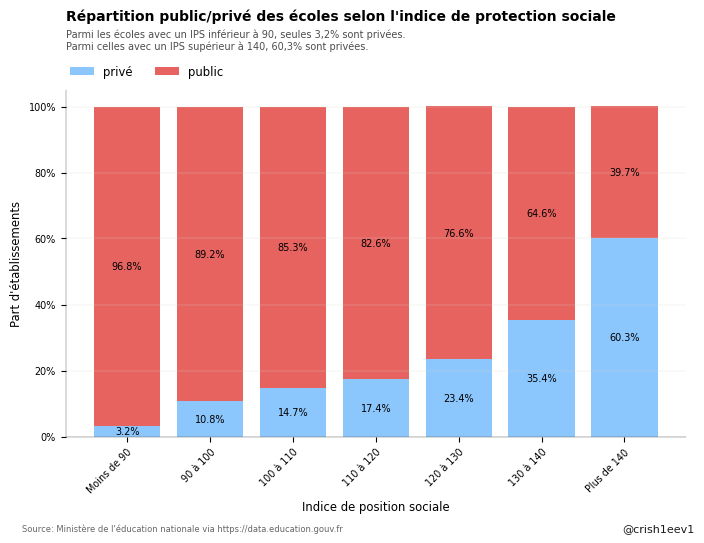

In [345]:
fig, ax = plt.subplots()
bar1 = ax.bar(ips_ecole_split.index, ips_ecole_split['privé sous contrat'], label='privé', color='#8BC6FC')
bar2 = ax.bar(ips_ecole_split.index, ips_ecole_split['public'], label='public', bottom=ips_ecole_split['privé sous contrat'], color='#E66360')

ax.set_title('Répartition public/privé des écoles selon l\'indice de protection sociale', pad=50)
ax.legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left", ncol=2, borderaxespad=0) #https://stackoverflow.com/questions/4700614/how-to-put-the-legend-outside-the-plot/43439132#43439132
ax.set_xlabel("Indice de position sociale")
ax.set_ylabel("Part d'établissements")

ax.set_xticklabels(
    labels=ips_ecole_split.index,
    rotation=45, 
    ha="right",  
    rotation_mode="anchor")

label_bar1 = ((ips_ecole_split['privé sous contrat']*100).round(2).astype(str)) + '%'
label_bar2 = ((ips_ecole_split['public']*100).round(2).astype(str)) + '%'
ax.bar_label(bar1, padding=0, label_type='center', labels=label_bar1, fontsize=7)
ax.bar_label(bar2, padding=0, label_type='center', labels=label_bar2, fontsize=7)

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))


# Subtitle
ax.text(x=.125, y=.97, 
        s="Parmi les écoles avec un IPS inférieur à 90, seules 3,2% sont privées.\nParmi celles avec un IPS supérieur à 140, 60,3% sont privées.", 
        transform=fig.transFigure, 
        ha='left', 
        fontsize=7, 
        alpha=.7)

# Source text
ax.text(x=.07, y=-0.1, 
        s="Source: Ministère de l'éducation nationale via https://data.education.gouv.fr", 
        transform=fig.transFigure, 
        ha='left', 
        fontsize=6, 
        alpha=.6)

# copyright text
ax.text(x=.82, y=-0.1, 
        s="@crish1eev1", 
        transform=fig.transFigure, 
        ha='left', 
        fontsize=8, 
        alpha=.9)
    
timestr = time.strftime("%Y-%m-%d_%H-%M-%S")
file_name = 'ecole_repartition-prive-public-selon-ips_' + timestr + ".png"
plt.savefig(data_out + file_name)

Graph used in report (Elementary School)

In [346]:
fig, ax = plt.subplots()
bar1 = ax.bar(ips_ecole_split.index, ips_ecole_split['privé sous contrat'], label='privé', color='#8BC6FC')
bar2 = ax.bar(ips_ecole_split.index, ips_ecole_split['public'], label='public', bottom=ips_ecole_split['privé sous contrat'], color='#E66360')

#ax.set_title('Répartition public/privé des écoles selon l\'indice de protection sociale', pad=50)
ax.legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left", ncol=2, borderaxespad=0) #https://stackoverflow.com/questions/4700614/how-to-put-the-legend-outside-the-plot/43439132#43439132
ax.set_xlabel("Indice de position sociale")
ax.set_ylabel("Part d'établissements")

ax.set_xticklabels(
    labels=ips_ecole_split.index,
    rotation=45, 
    ha="right",  
    rotation_mode="anchor")

label_bar1 = ((ips_ecole_split['privé sous contrat']*100).round(2).astype(str)) + '%'
label_bar2 = ((ips_ecole_split['public']*100).round(2).astype(str)) + '%'
ax.bar_label(bar1, padding=0, label_type='center', labels=label_bar1, fontsize=7)
ax.bar_label(bar2, padding=0, label_type='center', labels=label_bar2, fontsize=7)

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))


# Subtitle
# ax.text(x=.125, y=.97, 
#         s="Parmi les écoles avec un IPS inférieur à 90, seules 3,2% sont privées.\nParmi celles avec un IPS supérieur à 140, 60,3% sont privées.", 
#         transform=fig.transFigure, 
#         ha='left', 
#         fontsize=7, 
#         alpha=.7)

# Source text
ax.text(x=.07, y=-0.1, 
        s="Source: Ministère de l'éducation nationale via https://data.education.gouv.fr", 
        transform=fig.transFigure, 
        ha='left', 
        fontsize=6, 
        alpha=.6)

# copyright text
ax.text(x=.82, y=-0.1, 
        s="@crish1eev1", 
        transform=fig.transFigure, 
        ha='left', 
        fontsize=8, 
        alpha=.9)

# Save
file_name = 'ecole_repartition-prive-public-selon-ips_no-title' + ".png"
plt.savefig(graph_out + file_name)

# Avoid display with close method
plt.close(fig)

C:\Users\33671\AppData\Local\Temp\ipykernel_13796\3425922391.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator



Graph with title and annotation (College)

C:\Users\33671\AppData\Local\Temp\ipykernel_13796\3016908595.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator



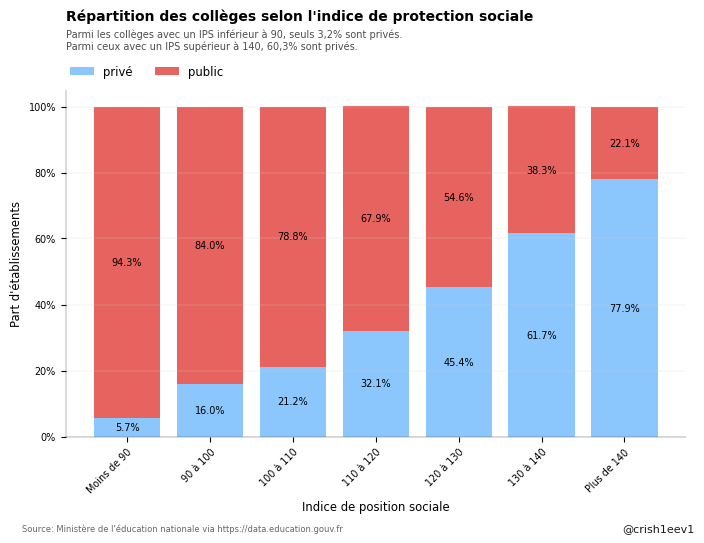

In [347]:
fig, ax = plt.subplots()
bar1 = ax.bar(ips_college_split.index, ips_college_split['privé sous contrat'], label='privé', color='#8BC6FC')
bar2 = ax.bar(ips_college_split.index, ips_college_split['public'], label='public', bottom=ips_college_split['privé sous contrat'], color='#E66360')

ax.set_title('Répartition des collèges selon l\'indice de protection sociale', pad=50)
ax.legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left", ncol=2, borderaxespad=0) #https://stackoverflow.com/questions/4700614/how-to-put-the-legend-outside-the-plot/43439132#43439132
ax.set_xlabel("Indice de position sociale")
ax.set_ylabel("Part d'établissements")

ax.set_xticklabels(
    labels=ips_college_split.index,
    rotation=45, 
    ha="right",  
    rotation_mode="anchor")

label_bar1 = ((ips_college_split['privé sous contrat']*100).round(2).astype(str)) + '%'
label_bar2 = ((ips_college_split['public']*100).round(2).astype(str)) + '%'
ax.bar_label(bar1, padding=0, label_type='center', labels=label_bar1, fontsize=7)
ax.bar_label(bar2, padding=0, label_type='center', labels=label_bar2, fontsize=7)


plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))


# Subtitle
ax.text(x=.125, y=.97, 
        s="Parmi les collèges avec un IPS inférieur à 90, seuls 3,2% sont privés.\nParmi ceux avec un IPS supérieur à 140, 60,3% sont privés.", 
        transform=fig.transFigure, 
        ha='left', 
        fontsize=7, 
        alpha=.7)

# Source text
ax.text(x=.07, y=-0.1, 
        s="Source: Ministère de l'éducation nationale via https://data.education.gouv.fr", 
        transform=fig.transFigure, 
        ha='left', 
        fontsize=6, 
        alpha=.6)

# copyright text
ax.text(x=.82, y=-0.1, 
        s="@crish1eev1", 
        transform=fig.transFigure, 
        ha='left', 
        fontsize=8, 
        alpha=.9)
    
timestr = time.strftime("%Y-%m-%d_%H-%M-%S")
file_name = 'ips-college' + timestr + ".png"
plt.savefig(data_out + file_name)

Graph used in report (College)

In [348]:
fig, ax = plt.subplots()
bar1 = ax.bar(ips_college_split.index, ips_college_split['privé sous contrat'], label='privé', color='#8BC6FC')
bar2 = ax.bar(ips_college_split.index, ips_college_split['public'], label='public', bottom=ips_college_split['privé sous contrat'], color='#E66360')

#ax.set_title('Répartition des collèges selon l\'indice de protection sociale', pad=50)
ax.legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left", ncol=2, borderaxespad=0) #https://stackoverflow.com/questions/4700614/how-to-put-the-legend-outside-the-plot/43439132#43439132
ax.set_xlabel("Indice de position sociale")
ax.set_ylabel("Part d'établissements")

ax.set_xticklabels(
    labels=ips_college_split.index,
    rotation=45, 
    ha="right",  
    rotation_mode="anchor")

label_bar1 = ((ips_college_split['privé sous contrat']*100).round(2).astype(str)) + '%'
label_bar2 = ((ips_college_split['public']*100).round(2).astype(str)) + '%'
ax.bar_label(bar1, padding=0, label_type='center', labels=label_bar1, fontsize=7)
ax.bar_label(bar2, padding=0, label_type='center', labels=label_bar2, fontsize=7)


plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0))


# Subtitle
# ax.text(x=.125, y=.97, 
#         s="Parmi les collèges avec un IPS inférieur à 90, seuls 3,2% sont privés.\nParmi ceux avec un IPS supérieur à 140, 60,3% sont privés.", 
#         transform=fig.transFigure, 
#         ha='left', 
#         fontsize=7, 
#         alpha=.7)

# Source text
ax.text(x=.07, y=-0.1, 
        s="Source: Ministère de l'éducation nationale via https://data.education.gouv.fr", 
        transform=fig.transFigure, 
        ha='left', 
        fontsize=6, 
        alpha=.6)

# copyright text
ax.text(x=.82, y=-0.1, 
        s="@crish1eev1", 
        transform=fig.transFigure, 
        ha='left', 
        fontsize=8, 
        alpha=.9)
    
# Save
file_name = 'college_repartition-prive-public-selon-ips_no-title' + ".png"
plt.savefig(graph_out + file_name)

# Avoid display with close method
plt.close(fig)

C:\Users\33671\AppData\Local\Temp\ipykernel_13796\3649913777.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator



#### 3.4 IPS and Geolocation

Ecoles

In [353]:
#https://plotly.com/python/reference/scattermapbox/

fig = px.scatter_mapbox(df_master[df_master["type_etablissement"] == 'ecole'], 
                     lat='latitude', lon='longitude', 
                     hover_name="nom_etablissment",
                     hover_data=['secteur', 'ips', 'type_etablissement'],
                     opacity  = 1,
                     center = {'lat': 46.5, 'lon': 2.6},
                     color = 'secteur',
                     color_discrete_sequence = ['#E66360', '#8BC6FC'],
                     zoom = 4.5,
                     mapbox_style = 'open-street-map',
                     width=800,
                     )

fig.update_traces(marker_size=3, selector=dict(type='scattermapbox'))

fig.update_layout(margin={"r":20, "t":20, "l":20, "b": 20})

file_name = 'geolocation-ecole-prive-public-selon-ips_no-title' + ".png"
fig.write_image(graph_out + file_name)

In [352]:
fig = px.scatter_mapbox(df_master[df_master["type_etablissement"] == 'ecole'], 
                     lat='latitude', lon='longitude', 
                     hover_name="nom_etablissment",
                     hover_data=['secteur', 'ips', 'type_etablissement'],
                     opacity  = 1,
                     center = {'lat': 46.5, 'lon': 2.6},
                     color = 'secteur',
                     color_discrete_sequence = ['#E66360', '#8BC6FC'],
                     zoom = 4.5,
                     mapbox_style = 'open-street-map',
                     width=800,
                     )

fig.update_traces(marker_size=7, selector=dict(type='scattermapbox'))

fig.update_layout(margin={"r":20, "t":20, "l":20, "b": 20})

fig.show()

file_name = 'geolocation-ecole-prive-public-selon-ips_no-title' + ".html"
plotly.offline.plot(fig, filename=graph_out + file_name)



'c:\\Users\\33671\\Documents\\Python\\IPS\\graphs\\geolocation-ecole-prive-public-selon-ips_no-title.html'

Collèges

In [354]:
fig = px.scatter_mapbox(df_master[df_master["type_etablissement"] == 'college'], 
                     lat='latitude', lon='longitude', 
                     hover_name="nom_etablissment",
                     hover_data=['secteur', 'ips', 'dnb_taux_de_reussite_21', 'type_etablissement'],
                     opacity  = 1,
                     center = {'lat': 46.5, 'lon': 2.6},
                     color = 'secteur',
                     color_discrete_sequence = ['#E66360', '#8BC6FC'],
                     zoom = 4.5,
                     mapbox_style = 'open-street-map',
                     width=800,
                     )

fig.update_traces(marker_size=5, selector=dict(type='scattermapbox'))

fig.update_layout(margin={"r":20, "t":20, "l":20, "b": 20})

file_name = 'geolocation-college-prive-public-selon-ips_no-title' + ".png"
fig.write_image(graph_out + file_name)

In [355]:
fig = px.scatter_mapbox(df_master[df_master["type_etablissement"] == 'college'], 
                     lat='latitude', lon='longitude', 
                     hover_name="nom_etablissment",
                     hover_data=['secteur', 'ips', 'dnb_taux_de_reussite_21', 'type_etablissement'],
                     opacity  = 1,
                     center = {'lat': 46.5, 'lon': 2.6},
                     color = 'secteur',
                     color_discrete_sequence = ['#E66360', '#8BC6FC'],
                     zoom = 4.5,
                     mapbox_style = 'open-street-map',
                     width=800,
                     )

fig.update_traces(marker_size=8, selector=dict(type='scattermapbox'))

fig.update_layout(margin={"r":20, "t":20, "l":20, "b": 20})


file_name = 'geolocation-college-prive-public-selon-ips_no-title' + ".html"
plotly.offline.plot(fig, filename=graph_out + file_name)

fig.show()

In [238]:
fig = px.scatter_mapbox(df_master[df_master["type_etablissement"] == 'ecole'], 
                     lat='latitude', lon='longitude', 
                     hover_name="nom_etablissment",
                     hover_data=['secteur', 'ips', 'type_etablissement'],
                     opacity  = 1,
                     center = {'lat': 48, 'lon': 3},
                     color = 'secteur',
                     color_discrete_sequence = ['#E66360', '#8BC6FC'],
                     zoom = 4.5,
                     mapbox_style = 'open-street-map',
                     )

fig.update_traces(marker_size=10, selector=dict(type='scattermapbox'))

fig.show()

## 4. Data Analysis and visualization (Revenus par commune)

#### 4.1 Tentative Niveau de vie

Le niveau de vie fait référence à la quantité de biens et services qu’un individu, un ménage ou une
population peut s’acheter avec le revenu dont il dispose. L’Insee définit le niveau de vie d’un ménage
comme le revenu disponible d'un ménage divisé par un coefficient, dénommé nombre d’unités de
consommation, qui dépend de la taille du ménage.
Diviser le revenu disponible par un nombre d'unités de consommation permet ainsi de comparer le
revenu des ménages de tailles différentes. En effet, un célibataire ayant un revenu de 1 500 € par
mois a un niveau de vie plus élevé qu'une famille nombreuse disposant du même revenu mensuel.


<AxesSubplot: xlabel='niveau_de_vie_commune', ylabel='ips'>

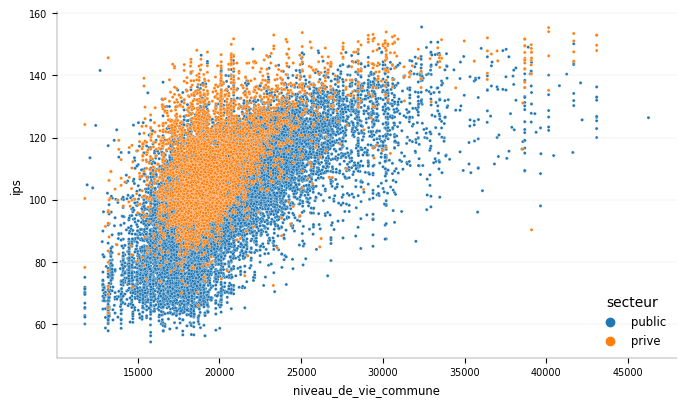

In [248]:
sns.scatterplot(data=df_master[df_master['type_etablissement']=="ecole"], x="niveau_de_vie_commune", y="ips", hue="secteur", s=5, )

## 5. Data Analysis & Visualization ("Brevet" success rate)

#### 4.1 ???

In [88]:
fig = px.violin(df_master[df_master['dnb_taux_de_reussite_21'] >= 40], 
                y='dnb_taux_de_reussite_21', 
                color='secteur', 
                box=True, 
                points=False
                )

fig.update_layout(violinmode='group', 
                  width=600, height=400,
                  title="Répartition des collèges selon le taux de reussite au brevet",
                  xaxis_title="",
                  yaxis_title="Taux de réussite au brevet",
                  margin=dict(l=90, r=50, b=50, t=70, pad=4),
                  legend=dict(orientation="h", yanchor="bottom",y=1.01, xanchor="left")
                          )

fig.show()

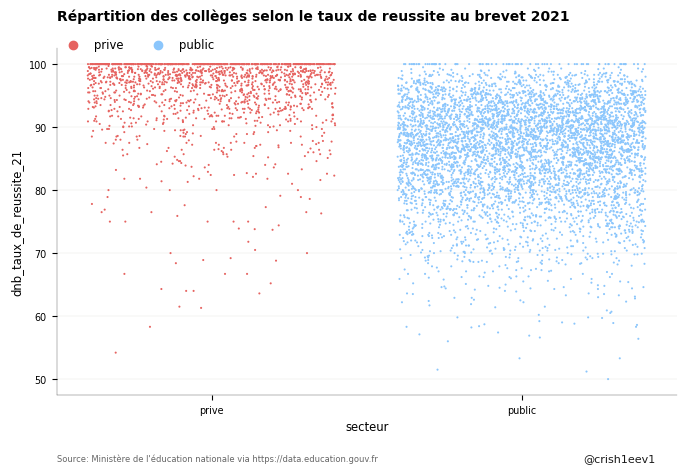

In [117]:
#stripplot
sns.stripplot(x="secteur", y="dnb_taux_de_reussite_21", 
              data=df_master[df_master['dnb_taux_de_reussite_21'] >= 50], 
              s=1.5, 
              order=["prive", "public"], 
              jitter=0.4,
              hue='secteur',
              hue_order = ['prive', 'public'],
              palette=['#E66360', '#8BC6FC']).set(title='Répartition des collèges selon le taux de reussite au brevet 2021')

plt.legend(bbox_to_anchor=(0, 0.98, 1, 0.2), loc="lower left", ncol=2, borderaxespad=0) #https://stackoverflow.com/questions/4700614/how-to-put-the-legend-outside-the-plot/43439132#43439132

# Source text
plt.text(x=-0.5, y=37,
        s="Source: Ministère de l'éducation nationale via https://data.education.gouv.fr", 
        ha='left', 
        fontsize=6, 
        alpha=.6)

# copyright text
plt.text(x=1.2, y=37, 
        s="@crish1eev1", 
        ha='left', 
        fontsize=8, 
        alpha=.9)


timestr = time.strftime("%Y-%m-%d_%H-%M-%S")
file_name = 'dnd_stripplot' + timestr + ".png"
plt.savefig(data_out + file_name)



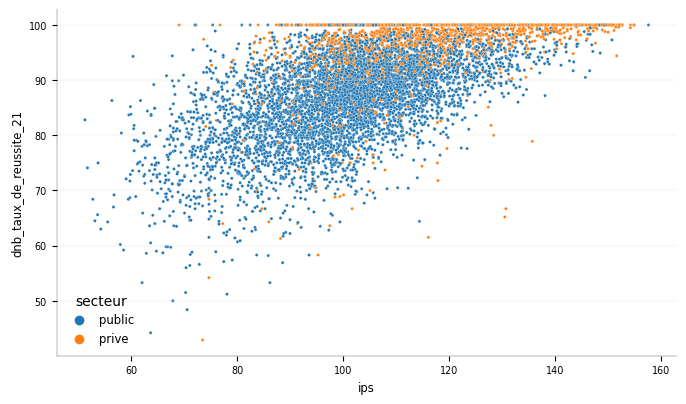

In [49]:
sns.scatterplot(data=df_master[df_master['dnb_taux_de_reussite_21'] >= 40], x="ips", y="dnb_taux_de_reussite_21", hue="secteur", s=5, )

timestr = time.strftime("%Y-%m-%d_%H-%M-%S")
file_name = 'dnd-ips-scatterplot_' + timestr + ".png"
plt.savefig(data_out + file_name)

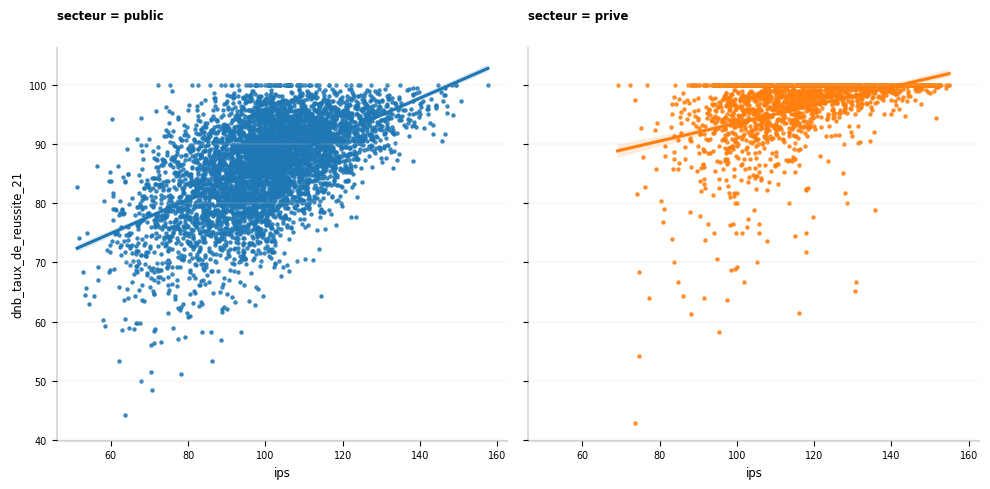

In [50]:
sns.lmplot(x = "ips", y = "dnb_taux_de_reussite_21",
           col = "secteur", hue = "secteur",
           data = df_master[df_master['dnb_taux_de_reussite_21'] >= 40],
           scatter_kws={"s": 5})

timestr = time.strftime("%Y-%m-%d_%H-%M-%S")
file_name = 'dnd-ips-lmplot_' + timestr + ".png"
plt.savefig(data_out + file_name)

- Faire varier la taille des dots par le nombre d'élèves
- Liste des établissements IPS les plus élevés & moins elevés (géo et liste) 
- Images dans un nouveau dossier
- Diviser 3.3 en sous catégories
